# Introduction - Load and Process data  
Challenge 1 : Notebook from Tobias Löwinthal, Emile Vandenbussche and Thomas Pezda

### Drive - Imports

Connect to Drive

In [1]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/Polimi/AN2DL Challenge/Homework1

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/.shortcut-targets-by-id/1DvrHADIF9kXpZh6k8XNiWlJSszGpRJNu/Homework1


Import librairies

In [17]:
# Hide warnings

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np

import logging

import random

In [18]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
print(tf.__version__)

2.14.0


In [19]:
# Import other libraries
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input as eff_preprocess_input
from tensorflow.keras.applications.efficientnet import preprocess_input as eff_v1_preprocess_input
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report, ConfusionMatrixDisplay, pairwise_distances
from sklearn.preprocessing import OneHotEncoder
from scipy.spatial.distance import squareform
import seaborn as sns
import scipy

### Load, Explore and Process the Dataset

In [20]:
# Conditional check for unzipping
unzip = False

if unzip:
    !unzip public_data.zip

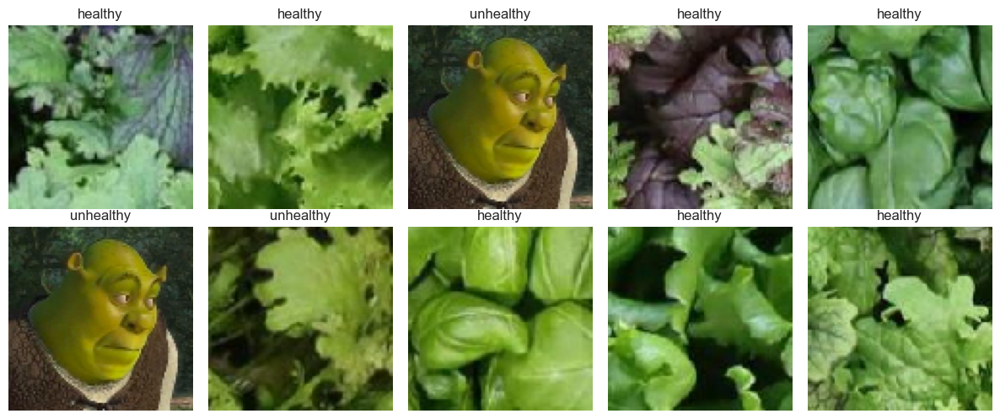

In [21]:
# Load the dataset from the npz file
data = np.load('public_data.npz', allow_pickle=True)

# Extract images and labels from the loaded data
images = data['data']
labels = data['labels']

num_images = len(images)

# Make sure images are in float32 format
images = images.astype('float32')

# Plot 10 random images
plt.figure(figsize=(12, 5))
for i in range(10):
    image = np.random.randint(0, num_images)
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[image]/255)
    plt.title(labels[image])
    plt.axis('off')

plt.tight_layout()
plt.show()

Research of outliers

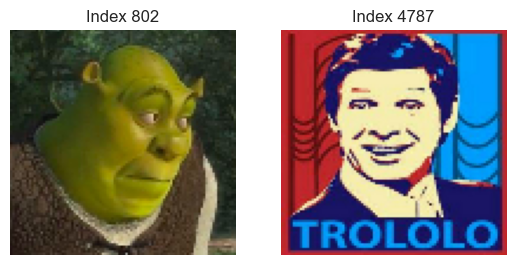

In [22]:
# Assuming you have images (X) and labels (y)
X = images  # Your image data

# Transform labels into 0 (healthy) and 1 (unhealthy)
y = np.where(labels == "healthy", 0, 1)

# Remove duplicate images
X, indices = np.unique(X,axis=0, return_index=True)
y = y[indices]

# An long exploration of pictures with biggest distances showed 2 outliers (see "Image retrieval" chapter)
indices_to_plot = [802, 4787]

# Plot the images with the specified indices
for i, index in enumerate(indices_to_plot):
    plt.subplot(1, len(indices_to_plot), i + 1)
    plt.imshow(X[index]/255)
    plt.title(f"Index {index}")
    plt.axis('off')

plt.show()

# Remove Shrek (index found through image retrieval)
X = np.delete(X, 802, 0)
y = np.delete(y, 802, 0)

# Remove Trololo (index found through image retrieval)
X = np.delete(X, 4786, 0)
y = np.delete(y, 4786, 0)

Chex the repartition of Healthy and Unhealthy

In [23]:
# Calculate and print label ratios
healthy_ratio = np.sum(y == 0) / len(y)
unhealthy_ratio = np.sum(y == 1) / len(y)

print(f"Healthy Ratio: {round(healthy_ratio, 2)}")
print(f"Unhealthy Ratio: {round(unhealthy_ratio, 2)}")

Healthy Ratio: 0.63
Unhealthy Ratio: 0.37


### Balance the data repartition with undersampling

This is how we planned to balance the data. As the score with balancing were worse than the score without, this was not used in the end.

In [24]:
# Separate healthy and unhealthy images
healthy_images = X[y == 0]

# Calculate pairwise distances between healthy images
distances = pairwise_distances(healthy_images.reshape(len(healthy_images), -1))
distances = squareform(distances)

# Set a threshold for similarity
threshold = 32.4  #adjusted after several tests to achieve 50-50%

# Find pairs of images that are too similar
similar_pairs = np.where(distances < threshold)

# Get the upper triangular part of the distance matrix
upper_triangular = np.triu_indices(len(healthy_images), k=1)

# Get the indices of the similar pairs
similar_pairs_indices = (upper_triangular[0][similar_pairs], upper_triangular[1][similar_pairs])

# Adjust the indices to the original dataset
to_remove_indices = []
for i, j in zip(*similar_pairs_indices):
    to_remove_indices.append(np.where(y == 0)[0][i])

# Remove the identified indices from the original dataset
undersampled_X = np.delete(X, to_remove_indices, axis=0)
undersampled_y = np.delete(y, to_remove_indices)
print(len(undersampled_X), len(undersampled_y))

# Calculate and print the new label ratios
healthy_ratio = np.sum(undersampled_y == 0) / len(undersampled_y)
unhealthy_ratio = np.sum(undersampled_y == 1) / len(undersampled_y)

print(f"Undersampled Healthy Ratio: {round(healthy_ratio, 2)}")
print(f"Undersampled Unhealthy Ratio: {round(unhealthy_ratio, 2)}")


4850 4850
Undersampled Healthy Ratio: 0.63
Undersampled Unhealthy Ratio: 0.37


### Split the data set

In [25]:
# Convert to one-hot encoding
y = tfk.utils.to_categorical(y, num_classes=2)

# Split data into train_val and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.25, stratify=np.argmax(y,axis=1))

# Further split train_val into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=len(X_test), stratify=np.argmax(y_train_val,axis=1))

# Print shapes of the datasets
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

# Calculate and print label ratios
train_label_ratios = np.sum(y_train, axis=0) / len(y_train)
val_label_ratios = np.sum(y_val, axis=0) / len(y_val)
test_label_ratios = np.sum(y_test, axis=0) / len(y_test)

print(f"Train Label Ratios (0: healthy, 1: unhealthy): {train_label_ratios}")
print(f"Validation Label Ratios (0: healthy, 1: unhealthy): {val_label_ratios}")
print(f"Test Label Ratios (0: healthy, 1: unhealthy): {test_label_ratios}")

X_train shape: (2424, 96, 96, 3), y_train shape: (2424, 2)
X_val shape: (1213, 96, 96, 3), y_val shape: (1213, 2)
X_test shape: (1213, 96, 96, 3), y_test shape: (1213, 2)
Train Label Ratios (0: healthy, 1: unhealthy): [0.6311881  0.36881188]
Validation Label Ratios (0: healthy, 1: unhealthy): [0.63066775 0.36933222]
Test Label Ratios (0: healthy, 1: unhealthy): [0.63066775 0.36933222]


#  Research best model

In [26]:
# Use mixed_precision to accelerate training, can not be used when a model needs to be finetuned as it throws an error
use_mix = False
if use_mix:
    policy = tfk.mixed_precision.Policy('mixed_float16')
    tfk.mixed_precision.set_global_policy(policy)

## MobileNetV2

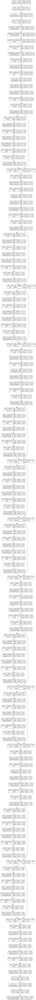

In [27]:
# Create MobileNetV2 model with specified settings
mobile_test = tfk.applications.MobileNetV2(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
)

# Display the model architecture with input shapes
tfk.utils.plot_model(mobile_test, show_shapes=True)

In [28]:
def build_model(input_shape=(96, 96, 3)):

    mobile = tfk.applications.MobileNetV2(
        input_shape=(96, 96, 3),
        include_top=False,
        weights="imagenet",
        pooling='avg',
    )

    # Use the supernet as feature extractor, i.e. freeze all its weigths
    mobile.trainable = False

    # Create an input layer with shape (96, 96, 3)
    inputs = tfk.Input(shape=input_shape, name = "inputs")

    # Connect MobileNetV2 to the input
    x = mobile(inputs)
    # Add a Dense layer with 2 units and softmax activation as the classifier
    outputs = tfkl.Dense(2, activation='softmax')(x)

    # Create a Model connecting input and output
    model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

    # Compile the model with Categorical Cross-Entropy loss and Adam optimizer
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

    return model

In [29]:
tl_model = build_model()

# Display model summary
tl_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 96, 96, 3)]       0         
                                                                 
 mobilenetv2_1.00_96 (Funct  (None, 1280)              2257984   
 ional)                                                          
                                                                 
 dense_1 (Dense)             (None, 2)                 2562      
                                                                 
Total params: 2260546 (8.62 MB)
Trainable params: 2562 (10.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [30]:
# Train the model
tl_history = tl_model.fit(
    x = preprocess_input(X_train*1), # We need to apply the preprocessing thought for the MobileNetV2 network
    y = y_train,
    batch_size = 32,
    epochs = 200,
    validation_data = (preprocess_input(X_val*1), y_val), # We need to apply the preprocessing thought for the MobileNetV2 network
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=100, restore_best_weights=True)]
).history

Epoch 1/200
76/76 [==============================] - 3s 19ms/step - loss: 0.6063 - accuracy: 0.6955 - val_loss: 0.4883 - val_accuracy: 0.7782
Epoch 2/200
76/76 [==============================] - 1s 11ms/step - loss: 0.4450 - accuracy: 0.7929 - val_loss: 0.4398 - val_accuracy: 0.7939
Epoch 3/200
76/76 [==============================] - 1s 11ms/step - loss: 0.4034 - accuracy: 0.8090 - val_loss: 0.4251 - val_accuracy: 0.7988
Epoch 4/200
76/76 [==============================] - 1s 11ms/step - loss: 0.3700 - accuracy: 0.8395 - val_loss: 0.4046 - val_accuracy: 0.8013
Epoch 5/200
76/76 [==============================] - 1s 11ms/step - loss: 0.3528 - accuracy: 0.8494 - val_loss: 0.4039 - val_accuracy: 0.8071
Epoch 6/200
76/76 [==============================] - 1s 11ms/step - loss: 0.3363 - accuracy: 0.8523 - val_loss: 0.4042 - val_accuracy: 0.8054
Epoch 7/200
76/76 [==============================] - 1s 11ms/step - loss: 0.3219 - accuracy: 0.8647 - val_loss: 0.4020 - val_accuracy: 0.8046
Epoch 

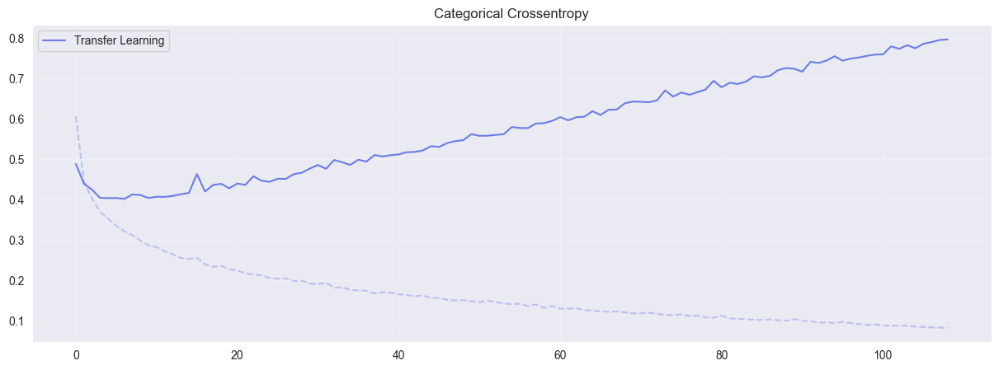

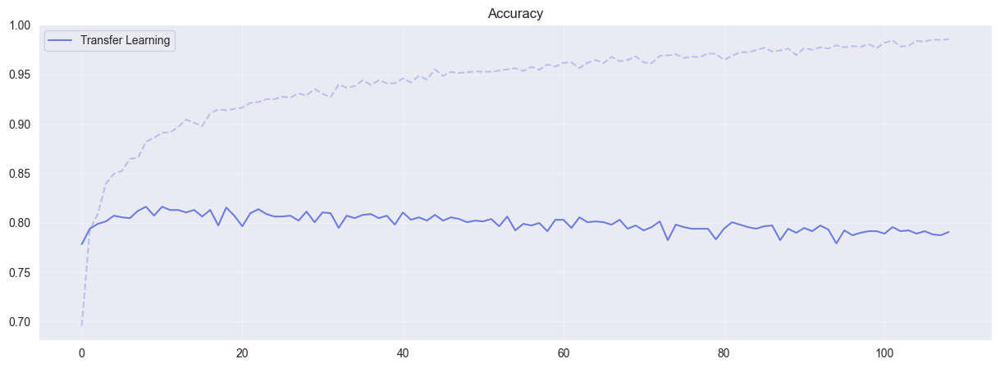

In [31]:
# Plot the transfer learning MobileNetV2 training histories
plt.figure(figsize=(15,5))
plt.plot(tl_history['loss'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(tl_history['val_loss'], label='Transfer Learning', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(tl_history['accuracy'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(tl_history['val_accuracy'], label='Transfer Learning', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [32]:
# Save the best model
tl_model.save('MobileNetModel')

In [33]:
# Predict labels for the entire test set
test_processed = preprocess_input(X_test*1)
predictions = tl_model.predict(test_processed, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (1213, 2)


In [34]:
# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

Accuracy: 0.7988
Precision: 0.7971
Recall: 0.761
F1: 0.7719


In [35]:
# delete model to save memory
del tl_model


### Augmentation

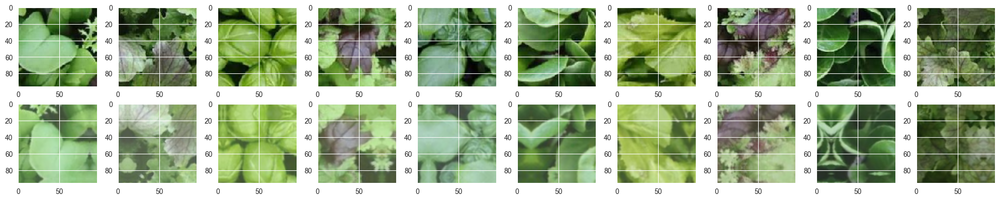

In [36]:
X_train_norm = X_train / 255
preprocessing = tf.keras.Sequential([
    tfkl.RandomFlip("horizontal_and_vertical"),
    tfkl.RandomRotation(0.2),
    #tfkl.RandomZoom(0.1),
    tfkl.RandomTranslation(0.2, 0.2),
    tfkl.RandomBrightness(0.2, value_range=(0, 1)),
    tfkl.RandomContrast(0.4),
], name='preprocessing')

X_train_aug = preprocessing(X_train_norm)

num_img = 10
fig, axes = plt.subplots(2, num_img, figsize=(20, 4))
for i in range(10):
    image = np.random.randint(0, len(X_train))
    ax = axes[0, i % num_img]
    ax.imshow(X_train_norm[image])
    ax = axes[1, i % num_img]
    ax.imshow(X_train_aug[image])
plt.tight_layout()
plt.show()

In [37]:
def build_model_with_augmentation(input_shape=(96, 96, 3)):
    mobile = tfk.applications.MobileNetV2(
        input_shape=(96, 96, 3),
        include_top=False,
        weights="imagenet",
        pooling='avg',
    )
        # Use the supernet as feature extractor, i.e. freeze all its weigths
    mobile.trainable = False

    # Create an input layer with shape (96, 96, 3)
    inputs = tfk.Input(shape=input_shape, name = "aug_inputs")

    preprocessing = tf.keras.Sequential([
        tfkl.RandomFlip("horizontal_and_vertical"),
        tfkl.RandomRotation(0.2),
        #tfkl.RandomZoom(0.1),
        tfkl.RandomTranslation(0.2, 0.2),
        #tfkl.RandomBrightness(0.2, value_range=(0, 1)),
        #tfkl.RandomContrast(0.4),
    ], name='preprocessing')

    preprocessing = preprocessing(inputs)

    # Connect MobileNetV2 to the input
    x = mobile(preprocessing)
    # Add a Dense layer with 2 units and softmax activation as the classifier
    outputs = tfkl.Dense(2, activation='softmax')(x)

    # Create a Model connecting input and output
    model = tfk.Model(inputs=inputs, outputs=outputs, name='aug_model')

    # Compile the model with Categorical Cross-Entropy loss and Adam optimizer
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

    return model

In [38]:
aug_model = build_model_with_augmentation()
# Display model summary
aug_model.summary()

Model: "aug_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 aug_inputs (InputLayer)     [(None, 96, 96, 3)]       0         
                                                                 
 preprocessing (Sequential)  (None, 96, 96, 3)         0         
                                                                 
 mobilenetv2_1.00_96 (Funct  (None, 1280)              2257984   
 ional)                                                          
                                                                 
 dense_2 (Dense)             (None, 2)                 2562      
                                                                 
Total params: 2260546 (8.62 MB)
Trainable params: 2562 (10.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [39]:
# Train the model
aug_history = aug_model.fit(
    x = preprocess_input(X_train*1), # We need to apply the preprocessing thought for the MobileNetV2 network
    y = y_train,
    batch_size = 32,
    epochs = 400,
    validation_data = (preprocess_input(X_val*1), y_val), # We need to apply the preprocessing thought for the MobileNetV2 network
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=100, restore_best_weights=True)]
).history

Epoch 1/400
76/76 [==============================] - 5s 28ms/step - loss: 0.6848 - accuracy: 0.6337 - val_loss: 0.5671 - val_accuracy: 0.7164
Epoch 2/400
76/76 [==============================] - 1s 13ms/step - loss: 0.5452 - accuracy: 0.7335 - val_loss: 0.5066 - val_accuracy: 0.7650
Epoch 3/400
76/76 [==============================] - 1s 13ms/step - loss: 0.5341 - accuracy: 0.7397 - val_loss: 0.4989 - val_accuracy: 0.7650
Epoch 4/400
76/76 [==============================] - 1s 13ms/step - loss: 0.5155 - accuracy: 0.7446 - val_loss: 0.5118 - val_accuracy: 0.7436
Epoch 5/400
76/76 [==============================] - 1s 13ms/step - loss: 0.5102 - accuracy: 0.7450 - val_loss: 0.5198 - val_accuracy: 0.7617
Epoch 6/400
76/76 [==============================] - 1s 14ms/step - loss: 0.4910 - accuracy: 0.7644 - val_loss: 0.4663 - val_accuracy: 0.7865
Epoch 7/400
76/76 [==============================] - 1s 13ms/step - loss: 0.4909 - accuracy: 0.7644 - val_loss: 0.4606 - val_accuracy: 0.7832
Epoch 

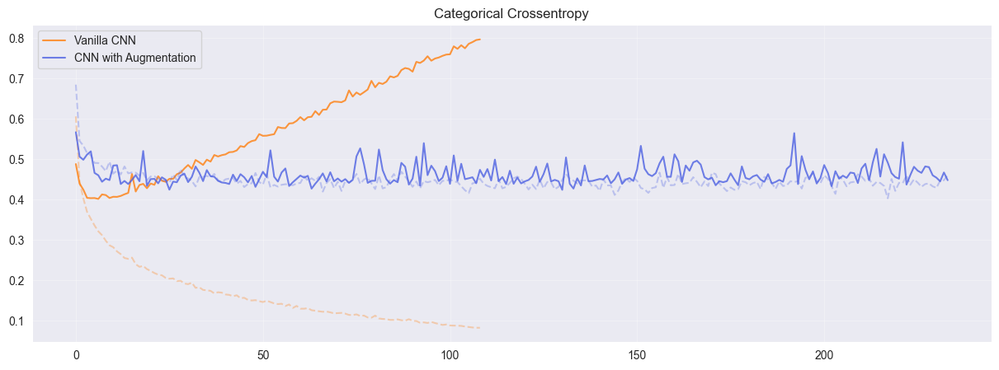

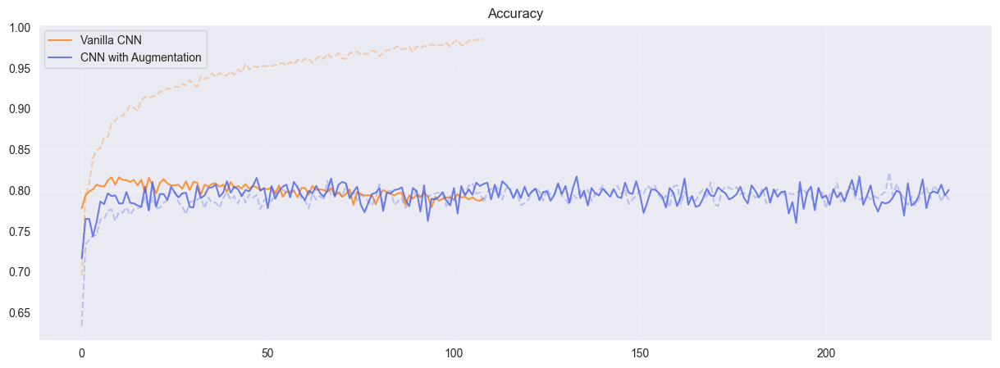

In [40]:
# Plot the training
plt.figure(figsize=(15,5))
plt.plot(tl_history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(tl_history['val_loss'], label='Vanilla CNN', alpha=.8, color='#ff7f0e')
plt.plot(aug_history['loss'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(aug_history['val_loss'], label='CNN with Augmentation', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(tl_history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(tl_history['val_accuracy'], label='Vanilla CNN', alpha=.8, color='#ff7f0e')
plt.plot(aug_history['accuracy'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(aug_history['val_accuracy'], label='CNN with Augmentation', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [41]:
# Save the best model
aug_model.save('AugTransferModel')

In [42]:
# Predict labels for the entire test set
test_processed = preprocess_input(X_test*1)
predictions = aug_model.predict(test_processed, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (1213, 2)


In [43]:
# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

Accuracy: 0.7898
Precision: 0.7771
Recall: 0.764
F1: 0.7692


In [44]:
# delete model to save memory
del aug_model

## EfficientNetV2

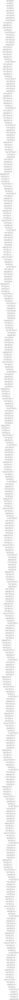

In [45]:
# Create EfficientNetV2 model with specified settings
efficient_test = tfk.applications.EfficientNetV2B3(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
)

# Display the model architecture with input shapes
tfk.utils.plot_model(efficient_test, show_shapes=True)

In [46]:
def build_efficient(input_shape=(96,96,3)):
    efficient = tfk.applications.EfficientNetV2B3(
        input_shape=(96, 96, 3),
        include_top=False,
        weights="imagenet",
        pooling='avg',
    )

    # Use the supernet as feature extractor, i.e. freeze all its weigths
    efficient.trainable = False

    # Create an input layer with shape (96, 96, 3)
    inputs = tfk.Input(shape=input_shape)

    preprocessing = tf.keras.Sequential([
        tfkl.RandomFlip("horizontal_and_vertical"),
        tfkl.RandomRotation(0.2),
        #tfkl.RandomZoom(0.1),
        tfkl.RandomTranslation(0.2, 0.2),
        #tfkl.RandomBrightness(0.2, value_range=(0, 1)),
        #tfkl.RandomContrast(0.4),
    ], name='preprocessing')

    preprocessing = preprocessing(inputs)

    # Connect EfficientNetV2 to the input
    x = efficient(preprocessing)
    # Add a Dense layer with 2 units and softmax activation as the classifier
    outputs = tfkl.Dense(2, activation='softmax')(x)

    # Create a Model connecting input and output
    model = tfk.Model(inputs=inputs, outputs=outputs, name='efficient_model')

    # Compile the model with Categorical Cross-Entropy loss and Adam optimizer
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

    return model

In [47]:
eff_model = build_efficient()
# Display model summary
eff_model.summary()

Model: "efficient_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 96, 96, 3)]       0         
                                                                 
 preprocessing (Sequential)  (None, 96, 96, 3)         0         
                                                                 
 efficientnetv2-b3 (Functio  (None, 1536)              12930622  
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 2)                 3074      
                                                                 
Total params: 12933696 (49.34 MB)
Trainable params: 3074 (12.01 KB)
Non-trainable params: 12930622 (49.33 MB)
_________________________________________________________________


In [48]:
# Train the model
eff_history = eff_model.fit(
    x = eff_preprocess_input(X_train), # We need to apply the preprocessing thought for the EfficientNetV2 network
    y = y_train,
    batch_size = 32,
    epochs = 400,
    validation_data = (eff_preprocess_input(X_val), y_val), # We need to apply the preprocessing thought for the EfficientNetV2 network
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=100, restore_best_weights=True)]
).history

Epoch 1/400
76/76 [==============================] - 13s 58ms/step - loss: 0.5994 - accuracy: 0.6811 - val_loss: 0.5401 - val_accuracy: 0.7131
Epoch 2/400
76/76 [==============================] - 2s 27ms/step - loss: 0.5552 - accuracy: 0.7153 - val_loss: 0.5013 - val_accuracy: 0.7609
Epoch 3/400
76/76 [==============================] - 2s 29ms/step - loss: 0.5233 - accuracy: 0.7426 - val_loss: 0.4899 - val_accuracy: 0.7708
Epoch 4/400
76/76 [==============================] - 2s 26ms/step - loss: 0.5069 - accuracy: 0.7525 - val_loss: 0.4873 - val_accuracy: 0.7593
Epoch 5/400
76/76 [==============================] - 2s 27ms/step - loss: 0.5034 - accuracy: 0.7533 - val_loss: 0.4594 - val_accuracy: 0.7890
Epoch 6/400
76/76 [==============================] - 2s 26ms/step - loss: 0.4973 - accuracy: 0.7649 - val_loss: 0.4640 - val_accuracy: 0.7758
Epoch 7/400
76/76 [==============================] - 2s 29ms/step - loss: 0.4853 - accuracy: 0.7731 - val_loss: 0.4515 - val_accuracy: 0.7923
Epoch

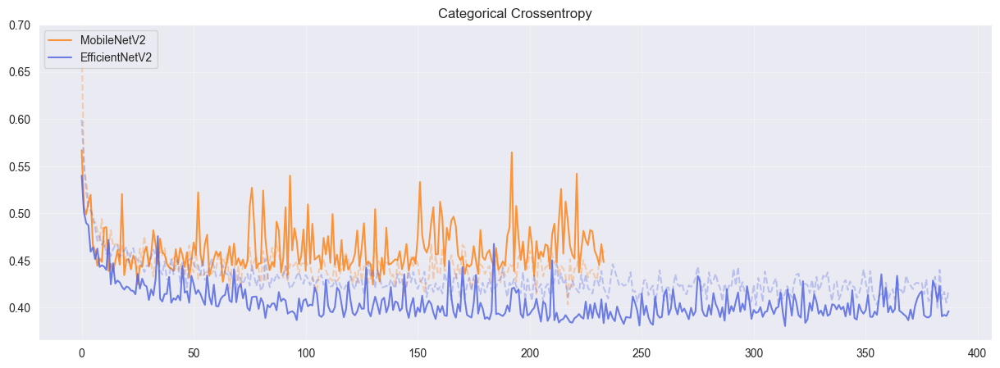

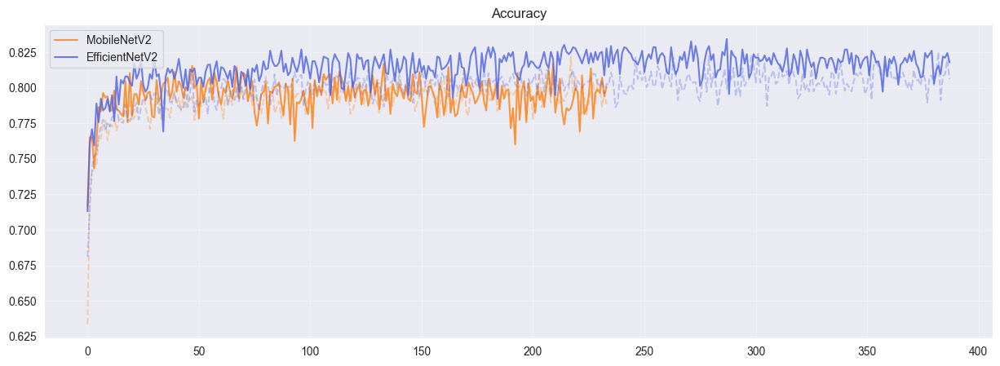

In [49]:
# Plot the training, compare with MobileNetV2
plt.figure(figsize=(15,5))
plt.plot(aug_history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(aug_history['val_loss'], label='MobileNetV2', alpha=.8, color='#ff7f0e')
plt.plot(eff_history['loss'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(eff_history['val_loss'], label='EfficientNetV2', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(aug_history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(aug_history['val_accuracy'], label='MobileNetV2', alpha=.8, color='#ff7f0e')
plt.plot(eff_history['accuracy'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(eff_history['val_accuracy'], label='EfficientNetV2', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [50]:
# Save the best model
eff_model.save('EfficientModel')

In [51]:
# Predict labels for the entire test set
test_processed = eff_preprocess_input(X_test)
predictions = eff_model.predict(test_processed, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (1213, 2)


In [52]:
# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

Accuracy: 0.8335
Precision: 0.8265
Recall: 0.8106
F1: 0.8171


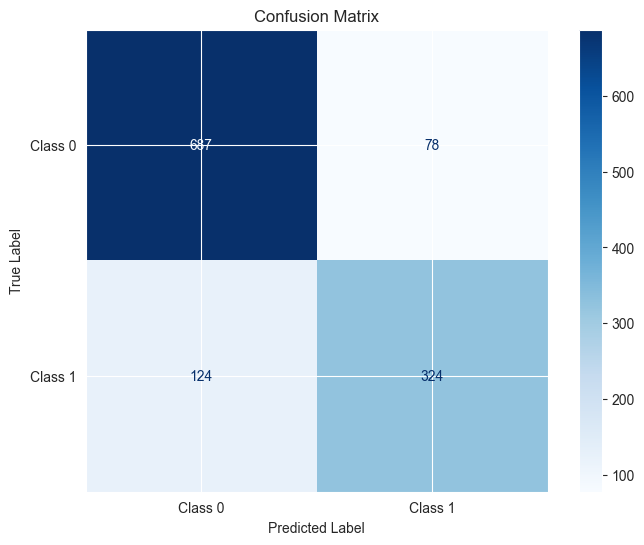

In [53]:
# Create a ConfusionMatrixDisplay object for better visualization
disp = ConfusionMatrixDisplay(cm, display_labels=['Class 0', 'Class 1'])

# Plot the confusion matrix with a heatmap and other styling options
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax, cmap='Blues', values_format='.4g')

# Add titles and labels
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Show the plot
plt.show()

In [54]:
# delete model to save memory
del eff_model

### Finetuning on EfficientNetV2

In [55]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('EfficientModel')
ft_model.summary()

Model: "efficient_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 96, 96, 3)]       0         
                                                                 
 preprocessing (Sequential)  (None, 96, 96, 3)         0         
                                                                 
 efficientnetv2-b3 (Functio  (None, 1536)              12930622  
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 2)                 3074      
                                                                 
Total params: 12933696 (49.34 MB)
Trainable params: 3074 (12.01 KB)
Non-trainable params: 12930622 (49.33 MB)
_________________________________________________________________


In [56]:
# Set all EfficientNetV2 layers as trainable
ft_model.get_layer('efficientnetv2-b3').trainable = True
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers):
   print(i, layer.name, layer.trainable)

0 input_6 True
1 rescaling_1 True
2 normalization_1 True
3 stem_conv True
4 stem_bn True
5 stem_activation True
6 block1a_project_conv True
7 block1a_project_bn True
8 block1a_project_activation True
9 block1b_project_conv True
10 block1b_project_bn True
11 block1b_project_activation True
12 block1b_drop True
13 block1b_add True
14 block2a_expand_conv True
15 block2a_expand_bn True
16 block2a_expand_activation True
17 block2a_project_conv True
18 block2a_project_bn True
19 block2b_expand_conv True
20 block2b_expand_bn True
21 block2b_expand_activation True
22 block2b_project_conv True
23 block2b_project_bn True
24 block2b_drop True
25 block2b_add True
26 block2c_expand_conv True
27 block2c_expand_bn True
28 block2c_expand_activation True
29 block2c_project_conv True
30 block2c_project_bn True
31 block2c_drop True
32 block2c_add True
33 block3a_expand_conv True
34 block3a_expand_bn True
35 block3a_expand_activation True
36 block3a_project_conv True
37 block3a_project_bn True
38 block3b_

In [57]:
# Freeze first N layers, e.g., until the 479th one
N = 479
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers[:N]):
  layer.trainable=False
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers):
    if isinstance(layer, tfkl.BatchNormalization):
        layer.trainable = False
    print(i, layer.name, layer.trainable)
ft_model.summary()

0 input_6 False
1 rescaling_1 False
2 normalization_1 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block1b_project_conv False
10 block1b_project_bn False
11 block1b_project_activation False
12 block1b_drop False
13 block1b_add False
14 block2a_expand_conv False
15 block2a_expand_bn False
16 block2a_expand_activation False
17 block2a_project_conv False
18 block2a_project_bn False
19 block2b_expand_conv False
20 block2b_expand_bn False
21 block2b_expand_activation False
22 block2b_project_conv False
23 block2b_project_bn False
24 block2b_drop False
25 block2b_add False
26 block2c_expand_conv False
27 block2c_expand_bn False
28 block2c_expand_activation False
29 block2c_project_conv False
30 block2c_project_bn False
31 block2c_drop False
32 block2c_add False
33 block3a_expand_conv False
34 block3a_expand_bn False
35 block3a_expand_activation False
36 block3a_project_conv False
3

In [58]:
# Compile the model
ft_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.Adam(1e-5), metrics='accuracy')

In [59]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = eff_preprocess_input(X_train), # We need to apply the preprocessing thought for the EfficientNetV2 network
    y = y_train,
    batch_size = 16,
    epochs = 500,
    validation_data = (eff_preprocess_input(X_val), y_val), # We need to apply the preprocessing thought for the EfficientNetV2 network
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=50, restore_best_weights=True)]
).history

Epoch 1/500
152/152 [==============================] - 14s 39ms/step - loss: 0.4646 - accuracy: 0.8164 - val_loss: 0.4364 - val_accuracy: 0.8293
Epoch 2/500
152/152 [==============================] - 3s 23ms/step - loss: 0.4633 - accuracy: 0.8065 - val_loss: 0.4360 - val_accuracy: 0.8203
Epoch 3/500
152/152 [==============================] - 3s 22ms/step - loss: 0.4625 - accuracy: 0.8094 - val_loss: 0.4359 - val_accuracy: 0.8195
Epoch 4/500
152/152 [==============================] - 3s 21ms/step - loss: 0.4582 - accuracy: 0.8086 - val_loss: 0.4357 - val_accuracy: 0.8178
Epoch 5/500
152/152 [==============================] - 3s 22ms/step - loss: 0.4559 - accuracy: 0.8061 - val_loss: 0.4358 - val_accuracy: 0.8153
Epoch 6/500
152/152 [==============================] - 3s 21ms/step - loss: 0.4635 - accuracy: 0.8053 - val_loss: 0.4356 - val_accuracy: 0.8145
Epoch 7/500
152/152 [==============================] - 4s 23ms/step - loss: 0.4607 - accuracy: 0.7974 - val_loss: 0.4355 - val_accuracy

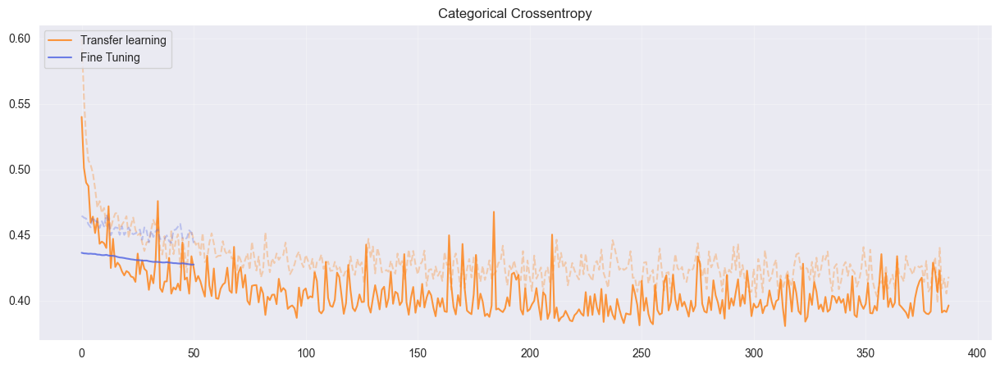

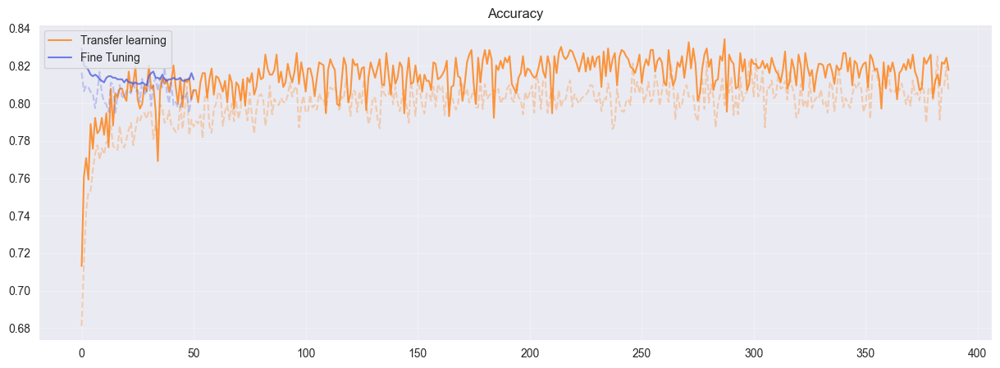

In [60]:
# Plot the transfer learning and the fine-tuned EfficientNetV2 training histories
plt.figure(figsize=(15,5))
plt.plot(eff_history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(eff_history['val_loss'], label='Transfer learning', alpha=.8, color='#ff7f0e')
plt.plot(ft_history['loss'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(ft_history['val_loss'], label='Fine Tuning', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(eff_history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(eff_history['val_accuracy'], label='Transfer learning', alpha=.8, color='#ff7f0e')
plt.plot(ft_history['accuracy'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(ft_history['val_accuracy'], label='Fine Tuning', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [61]:
# Save the best model
ft_model.save('FineTunedEfficientModel')

In [62]:
# Predict labels for the entire test set
test_processed = eff_preprocess_input(X_test)
predictions = ft_model.predict(test_processed, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (1213, 2)


In [63]:
# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

Accuracy: 0.8335
Precision: 0.8358
Recall: 0.8009
F1: 0.8126


In [64]:
# delete model to save memory
del ft_model

### Test different EfficientNet models

In [ ]:
def build_efficient_list(eff, input_shape=(96,96,3)):

    # Use the supernet as feature extractor, i.e. freeze all its weigths
    eff.trainable = False

    # Create an input layer with shape (96, 96, 3)
    inputs = tfk.Input(shape=input_shape)

    preprocessing = tf.keras.Sequential([
        tfkl.RandomFlip("horizontal_and_vertical"),
        tfkl.RandomRotation(0.2),
        tfkl.RandomTranslation(0.2, 0.2),
    ], name='preprocessing')

    preprocessing = preprocessing(inputs)

    # Connect EfficientNetV2 to the input
    x = eff(preprocessing)
    # Add a Dense layer with 2 units and softmax activation as the classifier
    outputs = tfkl.Dense(2, activation='softmax')(x)

    # Create a Model connecting input and output
    model = tfk.Model(inputs=inputs, outputs=outputs, name='efficient_model')

    # Compile the model with Categorical Cross-Entropy loss and Adam optimizer
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

    return model

In [ ]:
efficient_v2_models = [tfk.applications.EfficientNetV2B0(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.EfficientNetV2B1(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.EfficientNetV2B2(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.EfficientNetV2B3(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.EfficientNetV2S(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.EfficientNetV2M(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
)]
efficient_models = [tfk.applications.EfficientNetB2(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.EfficientNetB3(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.EfficientNetB4(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.EfficientNetB5(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
)]
models_v2 = []
for e in efficient_v2_models:
    models_v2.append(build_efficient_list(e))
models_v1 = []
for e in efficient_models:
    models_v1.append(build_efficient_list(e))

In [ ]:
# Train all models
histories_v2 = []
for m in models_v2:
    histories_v2.append(m.fit(
        x = eff_preprocess_input(X_train), # We need to apply the preprocessing thought for the EfficientNetV2 network
        y = y_train,
        batch_size = 32,
        epochs = 500,
        validation_data = (eff_preprocess_input(X_val), y_val), # We need to apply the preprocessing thought for the EfficientNetV2 network
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=100, restore_best_weights=True)]
    ).history)
histories_v1 = []
for m in models_v1:
    histories_v1.append(m.fit(
        x = eff_v1_preprocess_input(X_train), # We need to apply the preprocessing thought for the EfficientNet network
        y = y_train,
        batch_size = 32,
        epochs = 500,
        validation_data = (eff_v1_preprocess_input(X_val), y_val), # We need to apply the preprocessing thought for the EfficientNet network
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=100, restore_best_weights=True)]
    ).history)

In [ ]:
# Plot the histories v2
plt.figure(figsize=(15,5))
for i in range(len(histories_v2)):
    plt.plot(histories_v2[i]['loss'], alpha=.3, linestyle='--')
    plt.plot(histories_v2[i]['val_loss'], label=i, alpha=.8)

plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
for i in range(len(histories_v2)):
    plt.plot(histories_v2[i]['accuracy'], alpha=.3, linestyle='--')
    plt.plot(histories_v2[i]['val_accuracy'], label=i, alpha=.8)

plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

# Plot the histories v1
plt.figure(figsize=(15,5))
for i in range(len(histories_v1)):
    plt.plot(histories_v1[i]['loss'], alpha=.3, linestyle='--')
    plt.plot(histories_v1[i]['val_loss'], label=i, alpha=.8)

plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
for i in range(len(histories_v1)):
    plt.plot(histories_v1[i]['accuracy'], alpha=.3, linestyle='--')
    plt.plot(histories_v1[i]['val_accuracy'], label=i, alpha=.8)

plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [ ]:
# Predict labels for the entire test set for every model
predictions_v2 = []
for m in models_v2:
    predictions_v2.append(m.predict(eff_preprocess_input(X_test), verbose=0))
predictions_v1 = []
for m in models_v1:
    predictions_v1.append(m.predict(eff_v1_preprocess_input(X_test), verbose=0))

In [ ]:
# Compute and display every metric for every model v2
for i in range(len(models_v2)):
    print("Model:", i)
    print(models_v2[i].summary())
    # Compute the confusion matrix
    cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions_v2[i], axis=-1))

    # Compute classification metrics
    accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions_v2[i], axis=-1))
    precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions_v2[i], axis=-1), average='macro')
    recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions_v2[i], axis=-1), average='macro')
    f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions_v2[i], axis=-1), average='macro')

    # Display the computed metrics
    print('Accuracy:', accuracy.round(4))
    print('Precision:', precision.round(4))
    print('Recall:', recall.round(4))
    print('F1:', f1.round(4))
    print()

# Compute and display every metric for every model v1
for i in range(len(models_v1)):
    print("Model:", i)
    print(models_v1[i].summary())
    # Compute the confusion matrix
    cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions_v1[i], axis=-1))

    # Compute classification metrics
    accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions_v1[i], axis=-1))
    precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions_v1[i], axis=-1), average='macro')
    recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions_v1[i], axis=-1), average='macro')
    f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions_v1[i], axis=-1), average='macro')

    # Display the computed metrics
    print('Accuracy:', accuracy.round(4))
    print('Precision:', precision.round(4))
    print('Recall:', recall.round(4))
    print('F1:', f1.round(4))
    print()

## ConvNext

In [ ]:
def build_conv_list(conv, input_shape=(96,96,3)):

    # Use the supernet as feature extractor, i.e. freeze all its weigths
    conv.trainable = False

    # Create an input layer with shape (96, 96, 3)
    inputs = tfk.Input(shape=input_shape)

    preprocessing = tf.keras.Sequential([
        tfkl.RandomFlip("horizontal_and_vertical"),
        tfkl.RandomRotation(0.2),
        tfkl.RandomTranslation(0.2, 0.2),
    ], name='preprocessing')

    preprocessing = preprocessing(inputs)

    # Connect ConvNext to the input
    x = conv(preprocessing)
    # Add a Dense layer with 2 units and softmax activation as the classifier
    outputs = tfkl.Dense(2, activation='softmax')(x)

    # Create a Model connecting input and output
    model = tfk.Model(inputs=inputs, outputs=outputs, name='convnext_model')

    # Compile the model with Categorical Cross-Entropy loss and Adam optimizer
    model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

    return model

In [ ]:
conv_models = [tfk.applications.ConvNeXtTiny(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.ConvNeXtSmall(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.ConvNeXtBase(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.ConvNeXtLarge(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
), tfk.applications.ConvNeXtXLarge(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
)]
models = []
for e in conv_models:
    models.append(build_conv_list(e))

In [ ]:
# Train all models
histories = []
for m in models:
    histories.append(m.fit(
        x = X_train, # We need to apply the preprocessing thought for the ConvNeXt network, which is nothing
        y = y_train,
        batch_size = 32,
        epochs = 500,
        validation_data = (X_val, y_val), # We need to apply the preprocessing thought for the ConvNeXt network
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=100, restore_best_weights=True)]
    ).history)

In [ ]:
# Plot the ConvNeXt training histories
plt.figure(figsize=(15,5))
for i in range(len(histories)):
    plt.plot(histories[i]['loss'], alpha=.3, linestyle='--')
    plt.plot(histories[i]['val_loss'], label=i, alpha=.8)

plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
for i in range(len(histories)):
    plt.plot(histories[i]['accuracy'], alpha=.3, linestyle='--')
    plt.plot(histories[i]['val_accuracy'], label=i, alpha=.8)

plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [ ]:
# Predict labels for the entire test set for every model
predictions = []
for m in models:
    predictions.append(m.predict(X_test, verbose=0))

In [ ]:
# Compute and display every metric for every model
for i in range(len(models)):
    print("Model:", i)
    print(models[i].summary())
    # Compute the confusion matrix
    cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions[i], axis=-1))

    # Compute classification metrics
    accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions[i], axis=-1))
    precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions[i], axis=-1), average='macro')
    recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions[i], axis=-1), average='macro')
    f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions[i], axis=-1), average='macro')

    # Display the computed metrics
    print('Accuracy:', accuracy.round(4))
    print('Precision:', precision.round(4))
    print('Recall:', recall.round(4))
    print('F1:', f1.round(4))
    print()

## Grid-search on the number of layers and their characteristics

In [ ]:
nb_layers_list = [1, 2]
nb_neurons_list = [512, 256, 128]

grid_vals = []
accs = []

def build_convnet(nb_layers, nb_neurons, dropout, input_shape=(96, 96, 3)):
  convnet = tfk.applications.ConvNeXtBase(
      input_shape=(96, 96, 3),
      include_top=False,
      weights="imagenet",
      pooling='avg',
  )

  # Use the supernet as a feature extractor, i.e., freeze all its weights
  convnet.trainable = False

  # Create an input layer with shape (96, 96, 3)
  inputs = tfk.Input(shape=input_shape, name='input')

  preprocessing = tf.keras.Sequential([
      tfkl.RandomFlip("horizontal_and_vertical"),
      tfkl.RandomRotation(0.2),
      tfkl.RandomTranslation(0.2, 0.2),
  ], name='preprocessing')

  preprocessing = preprocessing(inputs)

  # Connect ConvNeXt to the input
  x = convnet(preprocessing, training=False)
  x = tfkl.Dropout(0.2, name='avg_dropout')(x)  # Regularize with dropout

  for i in range(1, nb_layers+1):
    x = tfkl.Dense(units=int(nb_neurons/i), activation='gelu')(x)
    if dropout:
      x = tfkl.Dropout(0.2)(x)  # Regularize with dropout

  dense = tfkl.Dense(units=2, activation='softmax', name='output')(x)

  # Create a Model connecting input and output
  model = tfk.Model(inputs=inputs, outputs=dense, name='conv_model')

  # Compile the model with Binary Cross-Entropy loss and AdamW optimizer
  model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(), metrics=['accuracy'])

  return model

for nb_layers in nb_layers_list:
  for nb_neurons in nb_neurons_list:
    for dropout in [True, False]:

      conv_model = build_convnet(nb_layers, nb_neurons, dropout)
      # Display model summary
      conv_model.summary()

      # Train the model
      conv_history = conv_model.fit(
          x = X_train, # We need to apply the preprocessing thought for the ConvNeXt network, which is nothing
          y = y_train,
          batch_size = 32,
          epochs = 500,
          validation_data = (X_val, y_val), # We need to apply the preprocessing thought for the ConvNeXt network
          callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=100, restore_best_weights=True)]
      ).history

      # Save the best model
      conv_model.save("ConvNext_" + str(nb_layers) + "_" + str(nb_neurons) + "_" + str(dropout))

      # Predict labels for the entire test set
      predictions = conv_model.predict(X_test, verbose=0)

      # Compute the confusion matrix
      cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

      # Compute classification metrics
      accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
      precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
      recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
      f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

      # Display the computed metrics
      print("nb_layers = ", nb_layers)
      print("nb_neurons = ", nb_neurons)
      print("dropout = ", dropout)
      print('Accuracy:', accuracy.round(4))
      print('Precision:', precision.round(4))
      print('Recall:', recall.round(4))
      print('F1:', f1.round(4))

      grid_vals.append((nb_layers, nb_neurons, dropout))
      accs.append((accuracy.round(4), precision.round(4), recall.round(4), f1.round(4)))

print()
for i in range(len(grid_vals)):
  print("nb_layers = ", grid_vals[i][0])
  print("nb_neurons = ", grid_vals[i][1])
  print("dropout = ", grid_vals[i][2])
  print('Accuracy:', accs[i][0])
  print('Precision:', accs[i][1])
  print('Recall:', accs[i][2])
  print('F1:', accs[i][3])
  print()

# Final single model

## Base model

In [65]:
def build_convnet(input_shape=(96,96,3)):
    convnet = tfk.applications.ConvNeXtBase(
        input_shape=(96, 96, 3),
        include_top=False,
        weights="imagenet",
        pooling='avg',
    )

    # Use the supernet as feature extractor, i.e. freeze all its weigths
    convnet.trainable = False

    # Create an input layer with shape (96, 96, 3)
    inputs = tfk.Input(shape=input_shape)

    preprocessing = tf.keras.Sequential([
        tfkl.RandomFlip("horizontal_and_vertical"),
        tfkl.RandomRotation(0.2),
        tfkl.RandomTranslation(0.2, 0.2),
    ], name='preprocessing')

    preprocessing = preprocessing(inputs)

    # Connect ConvNeXt to the input
    x = convnet(preprocessing, training = False)
    dropout = tfkl.Dropout(0.1)(x)  # Regularize with dropout

    dense1 = tfkl.Dense(units=256, activation='gelu',name='dense1')(dropout)
    dense1_dropout = tfkl.Dropout(0.2, name = 'dense1_dropout')(dense1)  # Regularize with dropout

    # Add a Dense layer with 2 units and softmax activation as the classifier
    outputs = tfkl.Dense(2, activation='softmax', name = 'output')(dense1_dropout)

    # Create a Model connecting input and output
    model = tfk.Model(inputs=inputs, outputs=outputs, name='final_model')

    # Compile the model with Binary Cross-Entropy loss and AdamW optimizer
    model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(), metrics=['accuracy'])

    return model

In [66]:
conv_model = build_convnet()
# Display model summary
conv_model.summary()

Model: "final_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 96, 96, 3)]       0         
                                                                 
 preprocessing (Sequential)  (None, 96, 96, 3)         0         
                                                                 
 convnext_base (Functional)  (None, 1024)              87566464  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense1 (Dense)              (None, 256)               262400    
                                                                 
 dense1_dropout (Dropout)    (None, 256)               0         
                                                                 
 output (Dense)              (None, 2)                 

In [67]:
# Train the model
conv_history = conv_model.fit(
    x = X_train, # We need to apply the preprocessing thought for the ConvNeXt network, which is nothing
    y = y_train,
    batch_size = 32,
    epochs = 500,
    validation_data = (X_val, y_val), # We need to apply the preprocessing thought for the ConvNeXt network
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=100, restore_best_weights=True)]
).history

Epoch 1/500
76/76 [==============================] - 31s 239ms/step - loss: 0.5965 - accuracy: 0.7178 - val_loss: 0.4336 - val_accuracy: 0.7848
Epoch 2/500
76/76 [==============================] - 9s 121ms/step - loss: 0.4692 - accuracy: 0.7822 - val_loss: 0.4898 - val_accuracy: 0.7601
Epoch 3/500
76/76 [==============================] - 9s 123ms/step - loss: 0.4304 - accuracy: 0.8003 - val_loss: 0.3898 - val_accuracy: 0.8195
Epoch 4/500
76/76 [==============================] - 9s 122ms/step - loss: 0.4227 - accuracy: 0.8086 - val_loss: 0.4446 - val_accuracy: 0.7890
Epoch 5/500
76/76 [==============================] - 9s 122ms/step - loss: 0.3922 - accuracy: 0.8271 - val_loss: 0.4209 - val_accuracy: 0.7997
Epoch 6/500
76/76 [==============================] - 9s 126ms/step - loss: 0.3737 - accuracy: 0.8350 - val_loss: 0.4385 - val_accuracy: 0.7947
Epoch 7/500
76/76 [==============================] - 10s 133ms/step - loss: 0.3570 - accuracy: 0.8379 - val_loss: 0.3605 - val_accuracy: 0.83

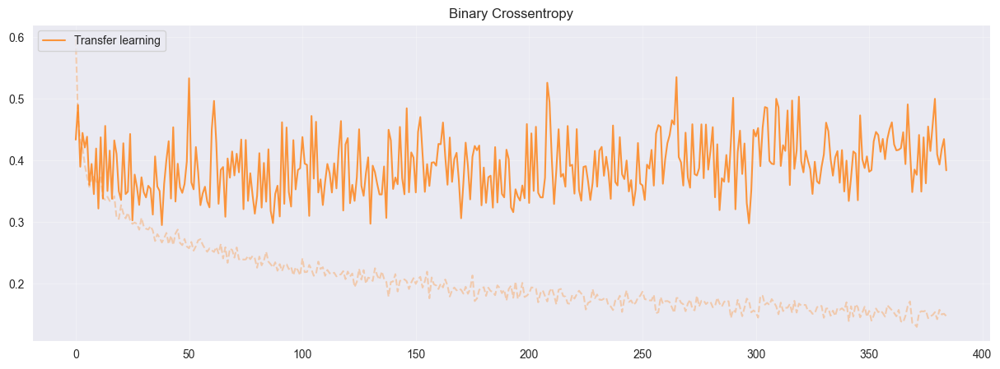

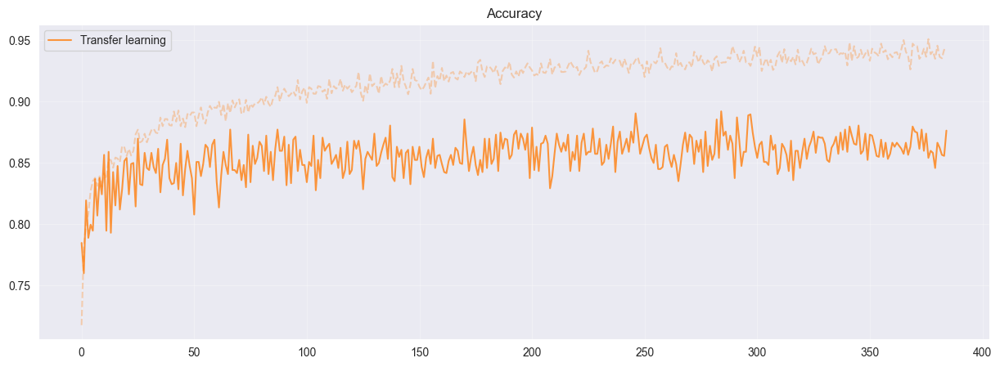

In [68]:
# Plot the transfer learning and the fine-tuned ConvNeXt training histories
plt.figure(figsize=(15,5))
plt.plot(conv_history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(conv_history['val_loss'], label='Transfer learning', alpha=.8, color='#ff7f0e')

plt.legend(loc='upper left')
plt.title('Binary Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(conv_history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(conv_history['val_accuracy'], label='Transfer learning', alpha=.8, color='#ff7f0e')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [69]:
# Save the best model
conv_model.save('FinalModelTest')

In [70]:
# Predict labels for the entire test set
predictions = conv_model.predict(X_test, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (1213, 2)


In [71]:
# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

Accuracy: 0.8961
Precision: 0.8958
Recall: 0.8793
F1: 0.8863


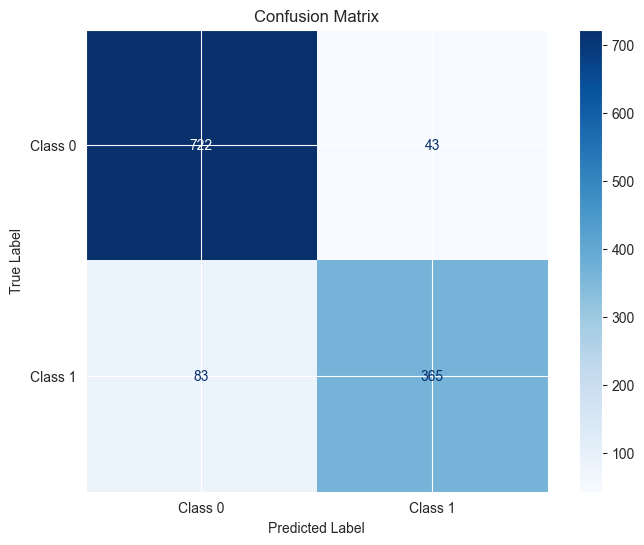

In [72]:
# Create a ConfusionMatrixDisplay object for better visualization
disp = ConfusionMatrixDisplay(cm, display_labels=['Class 0', 'Class 1'])

# Plot the confusion matrix with a heatmap and other styling options
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax, cmap='Blues', values_format='.4g')

# Add titles and labels
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Show the plot
plt.show()

In [73]:
# delete model to save memory
del conv_model

## Fine-tuning

In [74]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('FinalModelTest')
ft_model.summary()

Model: "final_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 96, 96, 3)]       0         
                                                                 
 preprocessing (Sequential)  (None, 96, 96, 3)         0         
                                                                 
 convnext_base (Functional)  (None, 1024)              87566464  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense1 (Dense)              (None, 256)               262400    
                                                                 
 dense1_dropout (Dropout)    (None, 256)               0         
                                                                 
 output (Dense)              (None, 2)                 

In [75]:
# Set all ConvNeXt layers as trainable
ft_model.get_layer('convnext_base').trainable = True
for i, layer in enumerate(ft_model.get_layer('convnext_base').layers):
   print(i, layer.name, layer.trainable)

0 input_8 True
1 convnext_base_prestem_normalization True
2 convnext_base_stem True
3 convnext_base_stage_0_block_0_depthwise_conv True
4 convnext_base_stage_0_block_0_layernorm True
5 convnext_base_stage_0_block_0_pointwise_conv_1 True
6 convnext_base_stage_0_block_0_gelu True
7 convnext_base_stage_0_block_0_pointwise_conv_2 True
8 convnext_base_stage_0_block_0_layer_scale True
9 convnext_base_stage_0_block_0_identity True
10 tf.__operators__.add True
11 convnext_base_stage_0_block_1_depthwise_conv True
12 convnext_base_stage_0_block_1_layernorm True
13 convnext_base_stage_0_block_1_pointwise_conv_1 True
14 convnext_base_stage_0_block_1_gelu True
15 convnext_base_stage_0_block_1_pointwise_conv_2 True
16 convnext_base_stage_0_block_1_layer_scale True
17 convnext_base_stage_0_block_1_identity True
18 tf.__operators__.add_1 True
19 convnext_base_stage_0_block_2_depthwise_conv True
20 convnext_base_stage_0_block_2_layernorm True
21 convnext_base_stage_0_block_2_pointwise_conv_1 True
22 co

In [76]:
# Freeze first N layers, e.g., until the 149th one
N = 149
for i, layer in enumerate(ft_model.get_layer('convnext_base').layers[:N]):
    layer.trainable = False
for i, layer in enumerate(ft_model.get_layer('convnext_base').layers):
    print(i, layer.name, layer.trainable)
ft_model.summary()

0 input_8 False
1 convnext_base_prestem_normalization False
2 convnext_base_stem False
3 convnext_base_stage_0_block_0_depthwise_conv False
4 convnext_base_stage_0_block_0_layernorm False
5 convnext_base_stage_0_block_0_pointwise_conv_1 False
6 convnext_base_stage_0_block_0_gelu False
7 convnext_base_stage_0_block_0_pointwise_conv_2 False
8 convnext_base_stage_0_block_0_layer_scale False
9 convnext_base_stage_0_block_0_identity False
10 tf.__operators__.add False
11 convnext_base_stage_0_block_1_depthwise_conv False
12 convnext_base_stage_0_block_1_layernorm False
13 convnext_base_stage_0_block_1_pointwise_conv_1 False
14 convnext_base_stage_0_block_1_gelu False
15 convnext_base_stage_0_block_1_pointwise_conv_2 False
16 convnext_base_stage_0_block_1_layer_scale False
17 convnext_base_stage_0_block_1_identity False
18 tf.__operators__.add_1 False
19 convnext_base_stage_0_block_2_depthwise_conv False
20 convnext_base_stage_0_block_2_layernorm False
21 convnext_base_stage_0_block_2_pointw

In [77]:
# Compile the model
ft_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics='accuracy')

In [78]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = 16,
    epochs = 400,
    validation_data = (X_val, y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=60, restore_best_weights=True)]
).history

Epoch 1/400
152/152 [==============================] - 69s 213ms/step - loss: 0.1643 - accuracy: 0.9336 - val_loss: 0.4301 - val_accuracy: 0.8508
Epoch 2/400
152/152 [==============================] - 20s 132ms/step - loss: 0.1431 - accuracy: 0.9464 - val_loss: 0.3446 - val_accuracy: 0.8928
Epoch 3/400
152/152 [==============================] - 22s 147ms/step - loss: 0.1403 - accuracy: 0.9427 - val_loss: 0.3826 - val_accuracy: 0.8846
Epoch 4/400
152/152 [==============================] - 23s 153ms/step - loss: 0.1234 - accuracy: 0.9497 - val_loss: 0.3913 - val_accuracy: 0.8722
Epoch 5/400
152/152 [==============================] - 24s 157ms/step - loss: 0.1217 - accuracy: 0.9550 - val_loss: 0.4444 - val_accuracy: 0.8730
Epoch 6/400
152/152 [==============================] - 24s 158ms/step - loss: 0.1077 - accuracy: 0.9571 - val_loss: 0.4060 - val_accuracy: 0.8821
Epoch 7/400
152/152 [==============================] - 25s 161ms/step - loss: 0.1108 - accuracy: 0.9587 - val_loss: 0.3873 -

KeyboardInterrupt: 

In [ ]:
# Plot the transfer learning and the fine-tuned ConvNeXt training histories
plt.figure(figsize=(15,5))
plt.plot(conv_history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(conv_history['val_loss'], label='Transfer learning', alpha=.8, color='#ff7f0e')
plt.plot(ft_history['loss'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(ft_history['val_loss'], label='Fine Tuning', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Binary Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(conv_history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(conv_history['val_accuracy'], label='Transfer learning', alpha=.8, color='#ff7f0e')
plt.plot(ft_history['accuracy'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(ft_history['val_accuracy'], label='Fine Tuning', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [ ]:
# Predict labels for the entire test set
predictions = ft_model.predict(X_test, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

In [ ]:
# Unfreeze all layers
for i, layer in enumerate(ft_model.get_layer('convnext_base').layers):
    layer.trainable = True
    print(i, layer.name, layer.trainable)
ft_model.summary()

In [ ]:
# Compile the model
ft_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics='accuracy')

In [ ]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = 16,
    epochs = 300,
    validation_data = (X_val, y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=30, restore_best_weights=True)]
).history

In [ ]:
# Plot the transfer learning and the fine-tuned ConvNeXt training histories
plt.figure(figsize=(15,5))
plt.plot(conv_history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(conv_history['val_loss'], label='Transfer learning', alpha=.8, color='#ff7f0e')
plt.plot(ft_history['loss'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(ft_history['val_loss'], label='Fine Tuning', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Binary Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(conv_history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(conv_history['val_accuracy'], label='Transfer learning', alpha=.8, color='#ff7f0e')
plt.plot(ft_history['accuracy'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(ft_history['val_accuracy'], label='Fine Tuning', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [ ]:
# Save the best model
ft_model.save('FineTunedFinalModelTest')

In [ ]:
# Predict labels for the entire test set
predictions = ft_model.predict(X_test, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1))
precision = precision_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(np.argmax(y_test, axis=-1), np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

In [ ]:
# delete model to save memory
del ft_model

## Class Activation Maps

In [ ]:
conv_model = tfk.models.load_model('FineTunedFinalModelTest')

In [ ]:
def compute_CAM(model, img):

    print("Computing Cam...")
    # Expand image dimensions to fit the model input shape
    img = np.expand_dims(img, axis=0)

    # Predict to get the winning class
    predictions = model.predict(img, verbose=0)
    label_index = np.argmax(predictions)

    # Get the 1028 input weights to the softmax of the winning class
    #model.summary()
    class_weights = model.layers[-1].get_weights()[0]
    class_weights_winner = class_weights[:, label_index]

    # Define the final convolutional layer of the MobileNetV2 model
    #model.get_layer('efficientnetv2-s').summary()
    final_conv_layer = tfk.Model(
        model.get_layer('convnext_base').input,
        model.get_layer('convnext_base').get_layer('convnext_base_stage_3_block_2_depthwise_conv').output
    )
    # Compute the convolutional outputs and squeeze the dimensions
    conv_outputs = final_conv_layer(img)
    conv_outputs = np.squeeze(conv_outputs)

    # Upsample the convolutional outputs and compute the final output using the class weights
    cw_for_mult = scipy.ndimage.zoom(class_weights_winner, (8), order=1)
    mat_for_mult = scipy.ndimage.zoom(conv_outputs.astype(np.uint16), (32, 32, 1), order=1)
    final_output = np.dot(mat_for_mult.reshape((96*96, 1024)), cw_for_mult).reshape(96,96)

    return final_output, label_index, predictions

In [ ]:
values = []
indices = random.choices(range(len(list(X_test))), k=5)
for i in indices:
    values.append(compute_CAM(conv_model, X_test[i]))
values = np.array(values[:10], dtype=object)

In [ ]:
y_test_cam = np.argmax(y_test, axis=-1)

# Plot 10 random images
plt.figure(figsize=(12, 5))
for i in range(5):
    image = np.random.randint(0, num_images)
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_test[indices[i]]/255)
    label = ''
    if y_test_cam[indices[i]] == 1:
      label += 'healthy'
    else:
      label += 'unhealthy'
    plt.title(label)
    plt.axis('off')

# Plot 10 CAMs
plt.figure(figsize=(12, 5))
for i in range(5):
    image = np.random.randint(0, num_images)
    plt.subplot(2, 5, i + 1)
    plt.imshow(values[i][0], cmap='turbo')
    plt.imshow(X_test[indices[i]]/255, alpha=0.5)
    label = 'predicted: '
    pred = int(values[i][1])
    if pred == 1:
      label += 'healthy'
    else:
      label += 'unhealthy'
    plt.title(label)
    plt.axis('off')

In [ ]:
# delete model to save memory
del conv_model

# Ensemble

For the better consistency we created an ensemble of 3 models, each trained on different random splits.

In [ ]:
# Number of models (bags)
num_models = 3

# List to store individual models
models = []

for model_num in range(num_models):
    # random split
     X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=len(X_test), stratify=np.argmax(y_train_val,axis=1))

    # Create a new instance of the model
    new_model = build_convnet()

    # Train the model on the random split
    new_model.fit(x = X_train,
                  y = y_train,
                  batch_size = 32,
                  epochs = 500,
                  validation_data = (X_val, y_val),
                  callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=80, restore_best_weights=True),
                       tfk.callbacks.ReduceLROnPlateau(monitor='val_accuracy', patience=5, factor=0.999, mode='max',min_lr=1e-5)])
    # Save base model
    new_model.save(f'BaseModel{model_num}')

    # FINE TUNING

    # Set all ConvNeXt layers as trainable
    new_model.get_layer('convnext_base').trainable = True
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        print(i, layer.name, layer.trainable)

    # Freeze first N layers, e.g., until the 149th one
    N = 149
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers[:N]):
        layer.trainable = False
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        print(i, layer.name, layer.trainable)
    new_model.summary()

    # Compile the model
    new_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics='accuracy')

    # Fine-tune the model
    ft_history = new_model.fit(
        x = X_train,
        y = y_train,
        batch_size = 16,
        epochs = 400,
        validation_data = (X_val, y_val),
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=60, restore_best_weights=True)]
    ).history


    # Unfreeze all layers
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        layer.trainable = True
        print(i, layer.name, layer.trainable)
    new_model.summary()

    # Compile the model
    new_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics='accuracy')

    # Fine-tune the model
    ft_history = new_model.fit(
        x = X_train,
        y = y_train,
        batch_size = 16,
        epochs = 300,
        validation_data = (X_val, y_val),
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=30, restore_best_weights=True)]
    ).history

    # Save final finetuned model
    new_model.save(f'EnsembleModel{model_num}')

    # Add the trained model to the list
    models.append(new_model)

In [ ]:
individual_predictions = []

# Get individual predictions for each model
for i, model in enumerate(models):
    y_pred_individual = model.predict(X_test)
    individual_predictions.append(np.argmax(y_pred_individual, axis=-1))

    # Calculate accuracy for each model
    accuracy_individual = accuracy_score(np.argmax(y_test, axis=-1), np.argmax(y_pred_individual, axis=-1))
    print(f"Accuracy for Model {i + 1}: {accuracy_individual}")


# Initialize the final_predictions array
final_predictions = np.zeros_like(individual_predictions[0])

# Initialize a counter for disagreements
disagreement_count = 0

# Iterate through each image prediction index
for i in range(len(individual_predictions[0])):
    # Create a dictionary to count the votes for each model for the current image
    vote_counts = {}

    # Count the votes for each model
    for m in range(len(models)):
        vote = individual_predictions[m][i]
        vote_counts[vote] = vote_counts.get(vote, 0) + 1

    # Find the majority vote
    majority_vote = max(vote_counts, key=vote_counts.get)

    # Assign the majority vote to the final_predictions array
    final_predictions[i] = majority_vote

    # Check for disagreements and increment the counter
    if len(vote_counts) > 1:
        disagreement_count += 1

# Calculate accuracy
accuracy = accuracy_score(np.argmax(y_test, axis=-1), final_predictions)
print(f"Accuracy: {accuracy}")

# Calculate the percentage of disagreements
disagreement_percentage = (disagreement_count / len(individual_predictions[0])) * 100
print(f"Percentage of Disagreement: {disagreement_percentage}%")

## Bagging

We also tried to bootstrap the samples and train the models on those to make them more different from each other. But since training one model takes a long time, we can only train 3 at max because of time constraints. This got a worse test score as it is not enough for bagging and was thus not used in the end.

In [ ]:
# Test to bootstrap samples
num_samples = len(X)

# bootstrap
indices = np.random.choice(num_samples, size=num_samples, replace=True)
# Create sets
X_train, y_train = X[indices], y[indices]

# Identify the unused indices for validation
unused_indices = list(set(range(num_samples)) - set(indices))

# Use the unused indices for validation
X_val, y_val = X[unused_indices], y[unused_indices]

print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")

In [ ]:
# Number of models (bags)
num_models = 3

# List to store individual models
models = []

# Number of bootstrap samples for each model
num_samples = len(X)

for model_num in range(num_models):

    # Bootstrap sampling
    indices = np.random.choice(num_samples, size=num_samples, replace=True)
    # Create sets
    X_train, y_train = X[indices], y[indices]

    # Identify the unused indices for validation
    unused_indices = list(set(range(num_samples)) - set(indices))

    # Use the unused indices for validation
    X_val, y_val = X[unused_indices], y[unused_indices]

    print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
    print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")

    # Create a new instance of the model
    new_model = build_convnet()

    # Train the model on the bootstrap samples
    new_model.fit(x = X_train,
                  y = y_train,
                  batch_size = 32,
                  epochs = 500,
                  validation_data = (X_val, y_val),
                  callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=70, restore_best_weights=True),
                       tfk.callbacks.ReduceLROnPlateau(monitor='val_accuracy', patience=5, factor=0.999, mode='max',min_lr=1e-5)])
    # Save base model
    new_model.save(f'Bagging_BaseModel{model_num}')

    #FINE TUNNING

    # Set all ConvNeXt layers as trainable
    new_model.get_layer('convnext_base').trainable = True
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        print(i, layer.name, layer.trainable)

    # Freeze first N layers, e.g., until the 149th one
    N = 149
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers[:N]):
        layer.trainable = False
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        print(i, layer.name, layer.trainable)
    new_model.summary()

    # Compile the model
    new_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics='accuracy')

    # Fine-tune the model
    ft_history = new_model.fit(
        x = X_train,
        y = y_train,
        batch_size = 16,
        epochs = 400,
        validation_data = (X_val, y_val),
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=40, restore_best_weights=True)]
    ).history


    # Unfreeze all layers
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        layer.trainable = True
        print(i, layer.name, layer.trainable)
    new_model.summary()

    # Compile the model
    new_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics='accuracy')

    # Fine-tune the model
    ft_history = new_model.fit(
        x = X_train,
        y = y_train,
        batch_size = 16,
        epochs = 300,
        validation_data = (X_val, y_val),
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=20, restore_best_weights=True)]
    ).history

    # Save final finetuned model
    new_model.save(f'Bagging_FineTunedModel{model_num}')

    # Add the trained model to the list
    models.append(new_model)

# Final run on all data

This is the final ensemble model we submitted, without a local test set.

In [ ]:
# Number of models (bags)
num_models = 3

# List to store individual models
models = []

for model_num in range(num_models):
    # random split
     X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=np.argmax(y,axis=1))

    # Create a new instance of the model
    new_model = build_convnet()

    # Train the model on the random split
    new_model.fit(x = X_train,
                  y = y_train,
                  batch_size = 32,
                  epochs = 500,
                  validation_data = (X_val, y_val),
                  callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=80, restore_best_weights=True),
                       tfk.callbacks.ReduceLROnPlateau(monitor='val_accuracy', patience=5, factor=0.999, mode='max',min_lr=1e-5)])
    # Save base model
    new_model.save(f'FinalBaseModel{model_num}')

    # FINE TUNING

    # Set all ConvNeXt layers as trainable
    new_model.get_layer('convnext_base').trainable = True
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        print(i, layer.name, layer.trainable)

    # Freeze first N layers, e.g., until the 149th one
    N = 149
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers[:N]):
        layer.trainable = False
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        print(i, layer.name, layer.trainable)
    new_model.summary()

    # Compile the model
    new_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics='accuracy')

    # Fine-tune the model
    ft_history = new_model.fit(
        x = X_train,
        y = y_train,
        batch_size = 16,
        epochs = 400,
        validation_data = (X_val, y_val),
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=60, restore_best_weights=True)]
    ).history


    # Unfreeze all layers
    for i, layer in enumerate(new_model.get_layer('convnext_base').layers):
        layer.trainable = True
        print(i, layer.name, layer.trainable)
    new_model.summary()

    # Compile the model
    new_model.compile(loss=tfk.losses.BinaryCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-5), metrics='accuracy')

    # Fine-tune the model
    ft_history = new_model.fit(
        x = X_train,
        y = y_train,
        batch_size = 16,
        epochs = 300,
        validation_data = (X_val, y_val),
        callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=30, restore_best_weights=True)]
    ).history

    # Save final finetuned model
    new_model.save(f'FinalEnsembleModel{model_num}')

    # Add the trained model to the list
    models.append(new_model)

Voting system to use our bagging : each image is evaluate by the 3 models, then we choose the majoritary output

In [ ]:
def compute_final_prediction(X, models)

    individual_predictions = []

    for i, model in enumerate(models):
        y_pred_individual = model.predict(X)
        individual_predictions.append(np.argmax(y_pred_individual, axis=-1))

    # Initialize the final_predictions array as a NumPy array
    final_predictions = np.zeros_like(individual_predictions[0], dtype=np.int64)

    # Iterate through each image prediction index
    for i in range(len(individual_predictions[0])):
        vote_counts = {}

        # Count the votes for each model
        for m in range(len(models)):
            vote = individual_predictions[m][i]
            vote_counts[vote] = vote_counts.get(vote, 0) + 1

        # Find the majority vote
        majority_vote = max(vote_counts, key=vote_counts.get)

        # Assign the majority vote to the final_predictions array
        final_predictions[i] = majority_vote

    # Convert the final_predictions array to a TensorFlow tensor
    final_predictions_tf = tf.convert_to_tensor(final_predictions, dtype=tf.int64)

    return final_predictions_tf

# Data cleaning

## Image retrieval

This is how we found the indices of the Tololo and Shrek image

In [ ]:
# Reset X and y
X = images
y = labels

# Remove duplicate images
X, indices = np.unique(X,axis=0, return_index=True)
y = y[indices]

In [ ]:
# Create MobileNetV2 model with specified settings
mobile = tfk.applications.MobileNetV2(
    input_shape=(96, 96, 3),
    include_top=False,
    weights="imagenet",
    pooling='avg',
)

# Display the model architecture with input shapes
tfk.utils.plot_model(mobile, show_shapes=True)

In [ ]:
# Pick random image
index = np.random.randint(0, len(X))

image = np.expand_dims(X[index],axis=0)
print(image.shape)
image_features = mobile.predict(image,verbose=0)
plt.imshow(X[index])
plt.show()

# Compute latent distance from picture to others
dataset_features = mobile.predict(X,batch_size=32,verbose=0)
distances = np.mean(np.square(dataset_features - image_features),axis=-1)
ordered_indices = distances.argsort()

# Create a list of tuples to store image, index, and distance
image_with_info = [(X[i], i, distances[i]) for i in ordered_indices]

# Reverse sort the list of tuples based on distance (Put highest distance in beginning)
sorted_image_with_info = sorted(image_with_info, key=lambda x: x[2], reverse=True)

# Inspect the data
num_img = 20  # You can adjust this as needed

# Calculate the number of rows and columns based on the number of images
rows = (num_img + 4) // 5  # This will give you 5 columns
cols = 5

# Plot all images
plt.figure(figsize=(24, 20))
for i in range(num_img):
    plt.subplot(rows, cols, i + 1)
    # Plot image
    plt.imshow(sorted_image_with_info[i][0])
    # Title index
    plt.title(sorted_image_with_info[i][1])
    plt.axis('off')

plt.tight_layout()
plt.show()

We plot images close to the Trololo image in distance, as the outliers will be closer to Tololo than to the leaves images.

In [ ]:
# Index of Trololo image, found before
index = 4787

image = np.expand_dims(X[index],axis=0)
print(image.shape)
image_features = mobile.predict(image,verbose=0)
plt.imshow(X[index])
plt.show()

# Compute latent distance from picture to others
dataset_features = mobile.predict(X,batch_size=32,verbose=0)
distances = np.mean(np.square(dataset_features - image_features),axis=-1)
ordered_indices = distances.argsort()

# Create a list of tuples to store image, index, and distance
image_with_info = [(X[i], i, distances[i]) for i in ordered_indices]

# Inspect the data
num_img = 20  # You can adjust this as needed

# Calculate the number of rows and columns based on the number of images
rows = (num_img + 4) // 5  # This will give you 5 columns
cols = 5

# Plot all images
plt.figure(figsize=(24, 20))
for i in range(num_img):
    plt.subplot(rows, cols, i + 1)
    # Plot image
    plt.imshow(image_with_info[i][0])
    # Title index
    plt.title(image_with_info[i][1])
    plt.axis('off')

plt.tight_layout()
plt.show()

Both outliers (Trololo and Shrek) are found. There are no duplicates of them in the data as we called np.unique() first. Now we can safely remove them using "X = np.delete(X, index, 0)" as seen in the Process Data Chapter.

## Duplicates

The following loop was used to try and discover whether there were duplicate images with different labels present in the data. If that were the case, duplicates should be removed more carefully as labels are not checked by the function np.unique().

This function does not return any images, thus we can conclude that there are no conflicting labels in the data.

In [ ]:
# Reset X
X = images  # Your image data

rows = 1
cols = 5

for i in range(len(X)):
  # Show progress
  if i % 100 == 0:
    print(i)
  for j in range(i + 1, len(X)):
    # If images are equal
    if np.array_equal(X[i], X[j]):
      # if labels are different, plot images
      if labels[i] != labels[j]:
        print("(i, j) = ", i, j)
        # Plot images
        plt.figure(figsize=(24, 20))

        plt.subplot(rows, cols, 1)
        plt.imshow(X[i])
        plt.title(labels[i])
        plt.axis('off')
        plt.subplot(rows, cols, 2)
        plt.imshow(X[j])
        plt.title(labels[j])
        plt.axis('off')

        plt.tight_layout()
        plt.show()